# Capstone Project
## Notebook 2: Exploratory Data Analysis & Some Data Cleaning

- Tia Plagata

- https://github.com/tiaplagata/capstone-project

- tiaplagata@gmail.com

In [166]:
# Import Statements

import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import string
import regex as re
import spacy

from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
from nltk import word_tokenize
from nltk import FreqDist

import warnings
warnings.filterwarnings('ignore')

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from wordcloud import WordCloud
from textwrap import wrap

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/tiaplagata/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/tiaplagata/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [4]:
# Read in the DataFrame I created in the Data Collection notebook 
df = pd.read_csv('/Users/tiaplagata/Documents/Flatiron/capstone-project/Data/cities_df', index_col=0)
df.head()

,Attraction,City
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom"
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom"
2,Ghost Bus Tour of London,"London, United Kingdom"
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom"
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom"


## Explore/clean the data
- Decide whether or not to get rid of duplicates
- Check out the class imbalance
- *No need to worry about null values because I scraped this dataset myself*

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28379 entries, 0 to 3693
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Attraction  28379 non-null  object
 1   City        28379 non-null  object
dtypes: object(2)
memory usage: 665.1+ KB


In [11]:
df.describe()

,Attraction,City
count,28379,28379
unique,27466,12
top,Desert Safari Dubai,"Rome, Italy"
freq,15,5000


In [78]:
df.shape

(27533, 2)

In [80]:
#No null values because I scraped everything myself. Just to double-check:
df.isna().sum()

Attraction    0
City          0
dtype: int64

### Duplicates

In [35]:
df.duplicated().sum()

846

In [37]:
# Look at duplicates in one city
df[(df.duplicated()==True) & (df['City']=='London, United Kingdom')]

,Attraction,City
185,"Windsor Castle, Stonehenge, and Oxford Day Tri...","London, United Kingdom"
241,Jack the Ripper Walking Tour in London,"London, United Kingdom"
259,British Museum Guided Tour,"London, United Kingdom"
618,Private Transfer from Heathrow Airport to London,"London, United Kingdom"
704,Oxford City Full-Day Private Tour from London,"London, United Kingdom"
705,Bath and Stonehenge Full-Day Private Tour from...,"London, United Kingdom"
706,Full-Day Private Guided Tour of Cambridge,"London, United Kingdom"
716,Full-Day Private Tour of Brighton,"London, United Kingdom"
900,PRIVATE Jack the Ripper Ghost Walking Tour in ...,"London, United Kingdom"
990,London to Southampton Cruise Terminals Private...,"London, United Kingdom"


In [26]:
df[df['Attraction']=='Oxford City Full-Day Private Tour from London']

,Attraction,City
431,Oxford City Full-Day Private Tour from London,"London, United Kingdom"
704,Oxford City Full-Day Private Tour from London,"London, United Kingdom"


In [29]:
# What about the top attraction?
df[df['Attraction']=='Desert Safari Dubai']

,Attraction,City
414,Desert Safari Dubai,"Dubai, United Arab Emirates"
478,Desert Safari Dubai,"Dubai, United Arab Emirates"
811,Desert Safari Dubai,"Dubai, United Arab Emirates"
974,Desert Safari Dubai,"Dubai, United Arab Emirates"
998,Desert Safari Dubai,"Dubai, United Arab Emirates"
1001,Desert Safari Dubai,"Dubai, United Arab Emirates"
1689,Desert Safari Dubai,"Dubai, United Arab Emirates"
1718,Desert Safari Dubai,"Dubai, United Arab Emirates"
1722,Desert Safari Dubai,"Dubai, United Arab Emirates"
1944,Desert Safari Dubai,"Dubai, United Arab Emirates"


**Clearly, I need to remove duplicates here, because there are some exact duplicates for certain cities.**

In [39]:
df = df.drop_duplicates()

In [83]:
df.to_csv('/Users/tiaplagata/Documents/Flatiron/capstone-project/Data/cities_cleaned')

### Class Imbalance

In [82]:
display(df.City.unique())
print('Total Unique Cities:', len(df.City.unique()))

array(['London, United Kingdom', 'Paris, France', 'Crete, Greece',
       'Bali, Indonesia', 'Rome, Italy', 'Phuket, Thailand',
       'Sicily, Italy', 'Majorca, Balearic Islands', 'Barcelona, Spain',
       'Istanbul, Turkey', 'Goa, India', 'Dubai, United Arab Emirates'],
      dtype=object)

Total Unique Cities: 12


In [42]:
cities = df.groupby('City').count()

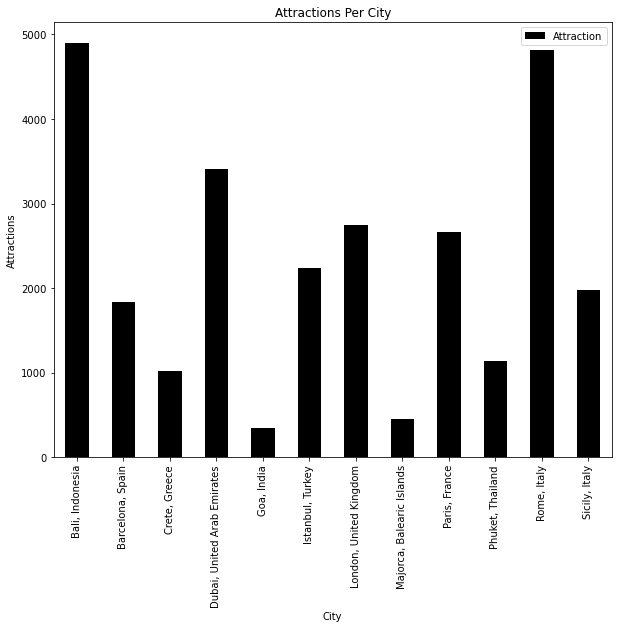

In [59]:
cities.plot(kind='bar', figsize=(10,8), colormap='bone')
plt.ylabel('Attractions')
plt.title('Attractions Per City')
plt.show()

In [60]:
cities.reset_index(inplace=True)

In [75]:
sorted_cities = cities.sort_values(by='Attraction', ascending=False)
sorted_cities

,City,Attraction
0,"Bali, Indonesia",4896
10,"Rome, Italy",4818
3,"Dubai, United Arab Emirates",3403
6,"London, United Kingdom",2743
8,"Paris, France",2669
5,"Istanbul, Turkey",2237
11,"Sicily, Italy",1982
1,"Barcelona, Spain",1831
9,"Phuket, Thailand",1136
2,"Crete, Greece",1019


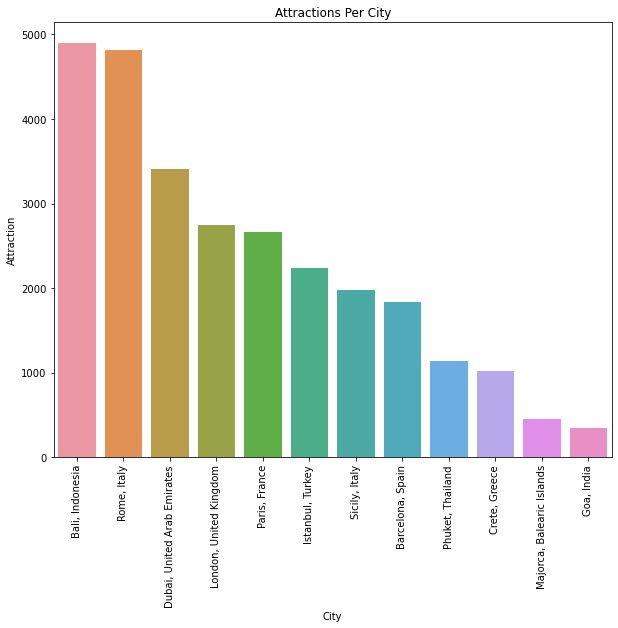

In [77]:
# A nicer plot
plt.figure(figsize=(10,8))
sns.barplot(x='City', y='Attraction', data=sorted_cities)
plt.title('Attractions Per City')
plt.xticks(rotation=90)
plt.show()

**FACT CHECK THIS**
**Although this would normally be an issue in modeling, we will build a document term matrix that will include all the vocabulary from all corpora (attractions), and train our model on that data. The document term matrix will have the same length for each city, so this class imbalance with different attractions may not be an issue.**

## Text Cleaning & Preprocessing & More Exploration
- Remove punctuation and numbers
- Lowercase everything
- Remove stopwords
- Create a document term matrix grouped by city 
    - count vectorization
    - tf-idf vectorization
    - bi-grams
- Create word clouds

In [93]:
# Create a list of stopwords
stopwords_list = stopwords.words('english')
stopwords_list += list(string.punctuation)

In [94]:
# Preview the list
stopwords_list[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [118]:
# Lowercase all words in each corpus
df['cleaned'] = df['Attraction'].apply(lambda x: x.lower())
df.head()

,Attraction,City,cleaned,tokenized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,"[sea, life, london, aquarium, admission, ticket]"
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london,"[the, jack, the, ripper, walking, tour, london]"
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london,"[ghost, bus, tour, london]"
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hop-on hop-off tour and river c...,"[big, bus, london, hop-on, hop-off, tour, rive..."
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk: serial killers and l...,"[the, blood, tears, walk, serial, killers, lon..."


In [139]:
# Remove commas, hyphens, colons, and other punctuation
df['cleaned'] = df['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))
df.head()

,Attraction,City,cleaned,tokenized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,"[sea, life, london, aquarium, admission, ticket]"
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london,"[the, jack, the, ripper, walking, tour, london]"
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london,"[ghost, bus, tour, london]"
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...,"[big, bus, london, hop-on, hop-off, tour, rive..."
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk serial killers and lo...,"[the, blood, tears, walk, serial, killers, lon..."


In [141]:
# Use regex to get rid of numbers 
df['cleaned'] = df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))
df.head(10)

,Attraction,City,cleaned,tokenized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,"[sea, life, london, aquarium, admission, ticket]"
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",the jack the ripper walking tour in london,"[the, jack, the, ripper, walking, tour, london]"
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour of london,"[ghost, bus, tour, london]"
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour and river cru...,"[big, bus, london, hop-on, hop-off, tour, rive..."
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",the blood and tears walk serial killers and lo...,"[the, blood, tears, walk, serial, killers, lon..."
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost and infamous murders walking tour,"[london, ghost, infamous, murders, walking, tour]"
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom",stonehenge windsor castle and bath from london,"[stonehenge, windsor, castle, bath, london]"
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros studio the making of harry potter ...,"[warner, bros, studio, the, making, harry, pot..."
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom",ghosts ghouls gallows london virtual tour,"[ghosts, ghouls, gallows, london, virtual, tour]"
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",highspeed thames river rib cruise in london,"[high-speed, thames, river, rib, cruise, london]"


In [171]:
!python -m spacy download en

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/Users/tiaplagata/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/en_core_web_sm
-->
/Users/tiaplagata/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [173]:
# Lemmatize the text using spacy
nlp = spacy.load('en')

df['cleaned'] = df['cleaned'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))
df.head(10)

,Attraction,City,cleaned,tokenized
0,SEA LIFE London Aquarium Admission Ticket,"London, United Kingdom",sea life london aquarium admission ticket,"[sea, life, london, aquarium, admission, ticket]"
1,The Jack The Ripper Walking Tour in London,"London, United Kingdom",jack ripper walking tour london,"[the, jack, the, ripper, walking, tour, london]"
2,Ghost Bus Tour of London,"London, United Kingdom",ghost bus tour london,"[ghost, bus, tour, london]"
3,Big Bus London Hop-On Hop-Off Tour and River C...,"London, United Kingdom",big bus london hopon hopoff tour river cruise ...,"[big, bus, london, hop-on, hop-off, tour, rive..."
4,The Blood and Tears Walk: Serial Killers and L...,"London, United Kingdom",blood tear walk serial killer london horror,"[the, blood, tears, walk, serial, killers, lon..."
5,London Ghost and Infamous Murders Walking Tour,"London, United Kingdom",london ghost infamous murder walk tour,"[london, ghost, infamous, murders, walking, tour]"
6,"Stonehenge, Windsor Castle, and Bath from London","London, United Kingdom",stonehenge windsor castle bath london,"[stonehenge, windsor, castle, bath, london]"
7,Warner Bros. Studio: The Making of Harry Potte...,"London, United Kingdom",warner bros studio making harry potter luxury ...,"[warner, bros, studio, the, making, harry, pot..."
8,"Ghosts, Ghouls & Gallows: London Virtual Tour","London, United Kingdom",ghost ghoul gallow london virtual tour,"[ghosts, ghouls, gallows, london, virtual, tour]"
9,High-Speed Thames River RIB Cruise in London,"London, United Kingdom",highspeed thames river rib cruise london,"[high-speed, thames, river, rib, cruise, london]"


In [185]:
# Group the corpora by city and join them
df_to_group = df[['City', 'cleaned']]
df_grouped = df_to_group.groupby(by='City').agg(lambda x:' '.join(x))
df_grouped

,cleaned
City,
"Bali, Indonesia",hotel hotelbali private transfer daytime bali ...
"Barcelona, Spain",interactive spanish cooking experience barcelo...
"Crete, Greece",minoans world museum cinema crete wine ol...
"Dubai, United Arab Emirates",premium red dune camel safari bbq al khayma ...
"Goa, India",fontainhas heritage walk sunset cruise paradis...
"Istanbul, Turkey",bosphorus sunset cruise luxury yacht istanbu...
"London, United Kingdom",sea life london aquarium admission ticket jack...
"Majorca, Balearic Islands",cave genova admission palma de mallorca shore ...
"Paris, France",bateaux parisiens seine river gourmet dinner ...


In [225]:
# Create a document term matrix using count vectorization
# Using count vectorization (most simple way to vectorize)
cv = CountVectorizer(analyzer='word', stop_words=stopwords_list, encoding='utf-8', strip_accents=None)
data = cv.fit_transform(df_grouped['cleaned'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index = df_grouped.index
df_dtm

,aal,abandon,abant,abba,abbate,abbey,abbeyprivate,abbeyst,aberfan,abian,...,تشيتا,خصوصي,دي,روما,فورميا,كاستيلوا,مدينة,من,ميرتيتوا,نقل
City,,,,,,,,,,,,,,,,,,,,,
"Bali, Indonesia",0,2,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
"Barcelona, Spain",1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Crete, Greece",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Dubai, United Arab Emirates",0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Goa, India",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Istanbul, Turkey",0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"London, United Kingdom",0,0,0,1,0,61,1,2,1,0,...,0,0,0,0,0,0,0,0,0,0
"Majorca, Balearic Islands",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Paris, France",0,0,0,0,0,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [226]:
# Save the count vectorization document term matrix for later use
df_dtm.to_csv('/Users/tiaplagata/Documents/Flatiron/capstone-project/Data/cv_dtm')

In [176]:
# Preview the vocabulary
cv.vocabulary_

{'hotel': 3673,
 'hotelbali': 3677,
 'private': 6040,
 'transfer': 7838,
 'daytime': 2095,
 'bali': 623,
 'white': 8463,
 'water': 8383,
 'raft': 6179,
 'snorkel': 7025,
 'tour': 7721,
 'blue': 963,
 'lagoon': 4256,
 'beach': 779,
 'allinclusive': 219,
 'inter': 3874,
 'kuta': 4232,
 'seminyak': 6777,
 'nisa': 5283,
 'dua': 2394,
 'ubud': 8026,
 'pvt': 6118,
 'instagram': 3855,
 'famous': 2793,
 'spot': 7160,
 'fullday': 3085,
 'temple': 7507,
 'unesco': 8069,
 'rice': 6380,
 'terrace': 7557,
 'transport': 7859,
 'lunch': 4548,
 'car': 1341,
 'hire': 3616,
 'chauffeur': 1564,
 'quad': 6131,
 'bike': 896,
 'adventure': 77,
 'good': 3308,
 'waterfall': 8387,
 'tibumana': 7633,
 'tukad': 7982,
 'cepung': 1480,
 'tegenungan': 7491,
 'monkey': 4999,
 'forest': 2998,
 'mengwi': 4824,
 'tanah': 7433,
 'lot': 4509,
 'afternoon': 102,
 'volcano': 8307,
 'hot': 3671,
 'spring': 7164,
 'jungle': 4038,
 'swing': 7378,
 'amazing': 254,
 'individual': 3806,
 'choose': 1617,
 'route': 6511,
 'driver'

In [217]:
# Create a document term matrix using TF-IDF vectorization
# Might be good for classifying cities
tfidf = TfidfVectorizer(analyzer='word', stop_words=stopwords_list)
data2 = tfidf.fit_transform(df_grouped['cleaned'])
df_dtm2 = pd.DataFrame(data2.toarray(), columns=tfidf.get_feature_names())
df_dtm2.index = df_grouped.index
df_dtm2

,aal,abandon,abant,abba,abbate,abbey,abbeyprivate,abbeyst,aberfan,abian,...,تشيتا,خصوصي,دي,روما,فورميا,كاستيلوا,مدينة,من,ميرتيتوا,نقل
City,,,,,,,,,,,,,,,,,,,,,
"Bali, Indonesia",0.000000,0.000699,0.00000,0.0000,0.000000,0.000000,0.0000,0.000,0.0000,0.000407,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Barcelona, Spain",0.000737,0.000000,0.00000,0.0000,0.000000,0.000000,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Crete, Greece",0.000000,0.000000,0.00000,0.0000,0.000000,0.000000,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Dubai, United Arab Emirates",0.000000,0.000310,0.00000,0.0000,0.000000,0.000000,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Goa, India",0.000000,0.000000,0.00000,0.0000,0.000000,0.000000,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Istanbul, Turkey",0.000000,0.000000,0.00059,0.0000,0.000000,0.000000,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"London, United Kingdom",0.000000,0.000000,0.00000,0.0005,0.000000,0.023129,0.0005,0.001,0.0005,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Majorca, Balearic Islands",0.000000,0.000000,0.00000,0.0000,0.003349,0.000000,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Paris, France",0.000000,0.000000,0.00000,0.0000,0.000000,0.002366,0.0000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [218]:
# Save the tf-idf document term matrix for later use
df_dtm2.to_csv('/Users/tiaplagata/Documents/Flatiron/capstone-project/Data/tfidf_dtm')

### Word Clouds with Count Vectorization

In [178]:
def generate_wordcloud(data, title):
    cloud = WordCloud(width=400, height=330, max_words=150, colormap='tab20c').generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('\n'.join(wrap(title,60)), fontsize=13)
    plt.show()

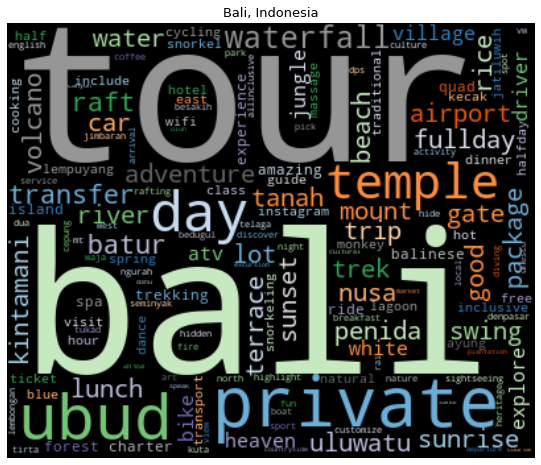

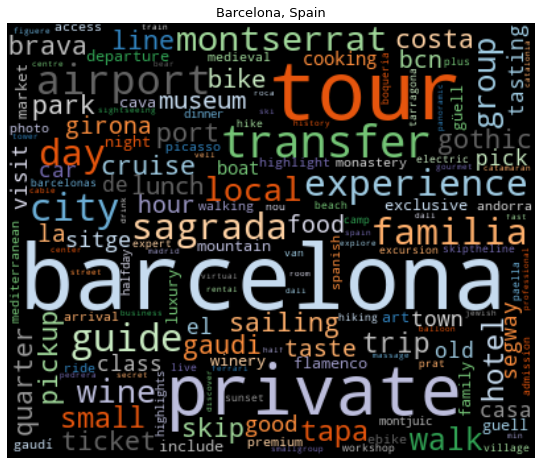

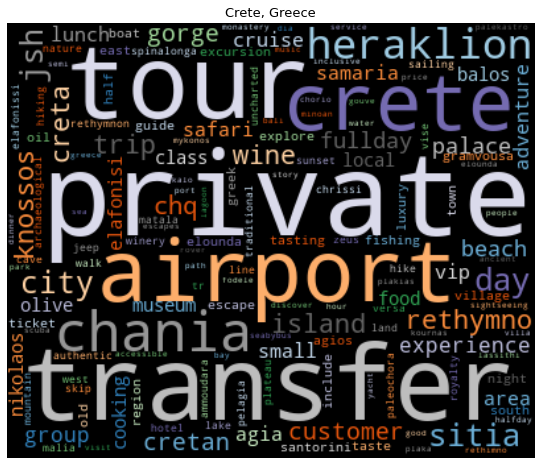

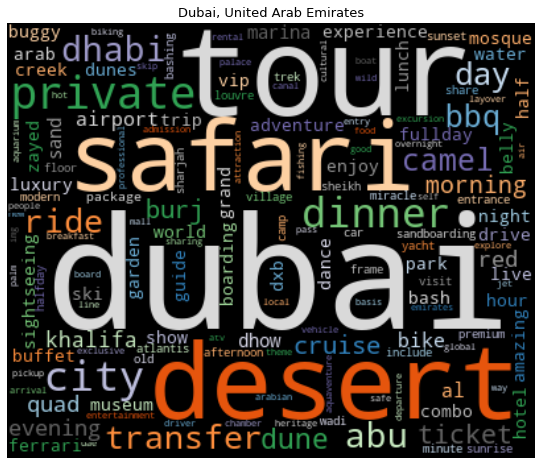

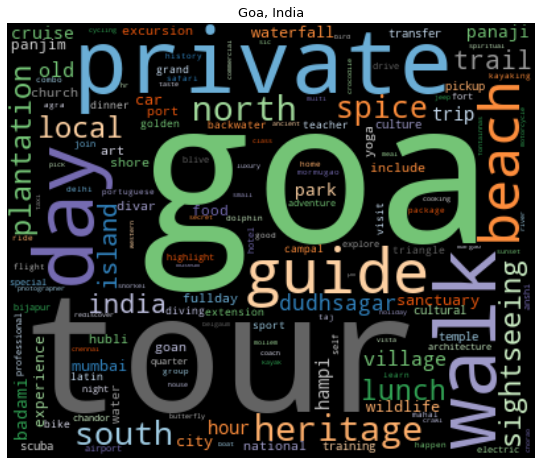

...

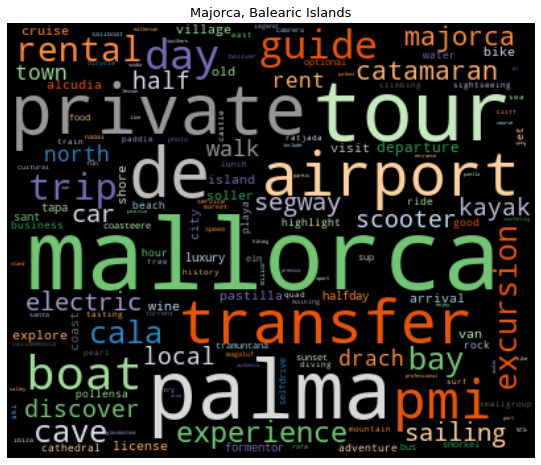

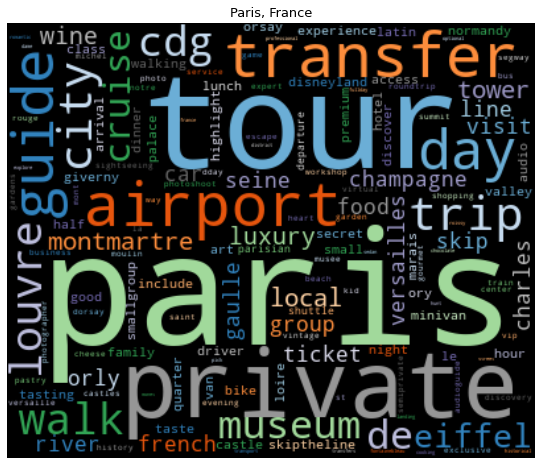

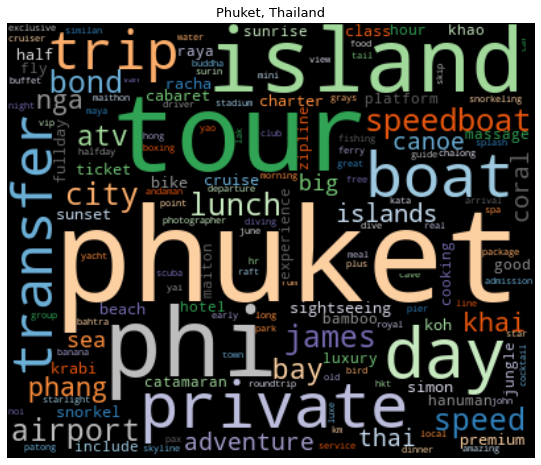

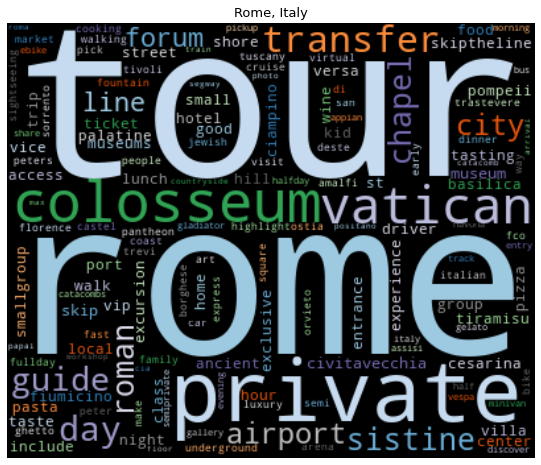

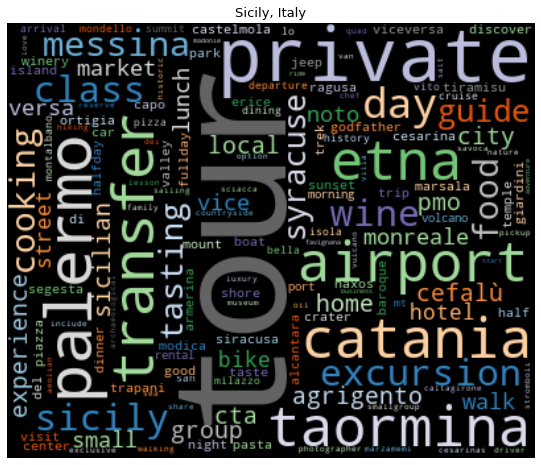

In [179]:
# Transposing document term matrix
df_dtm = df_dtm.transpose()

# Plotting word cloud for each city
for index, city in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[city].sort_values(ascending=False), city)

**There seems to be a lot of repetition with words like 'tour', 'private', 'transfer' between cities because all of these cities will have airport transfers, and different tours. However, these words will not help in modeling since they are not unique to the cities.**

### Word Clouds with TF-IDF Vectorization

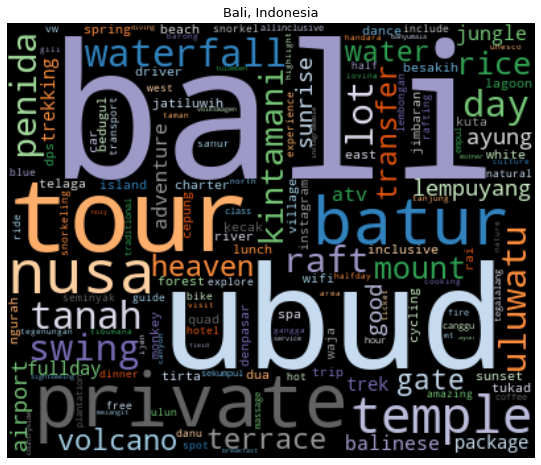

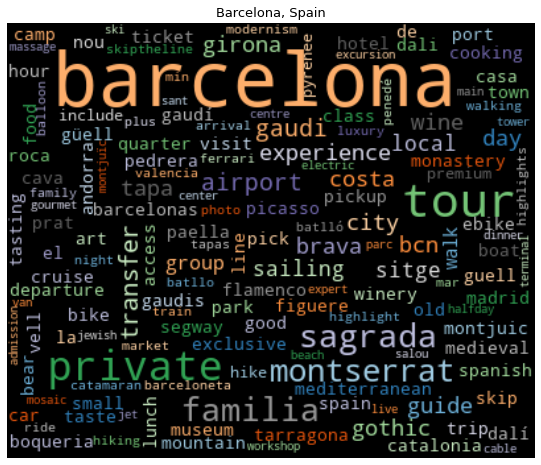

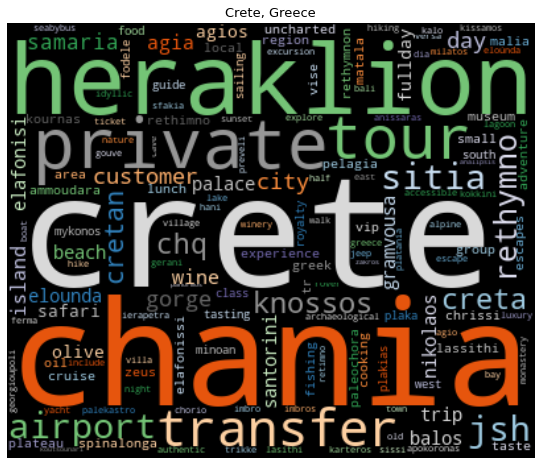

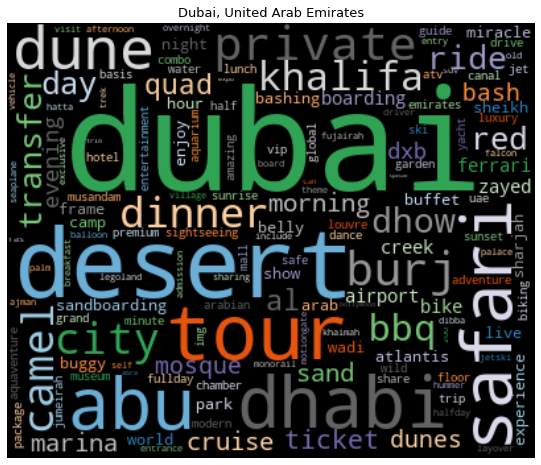

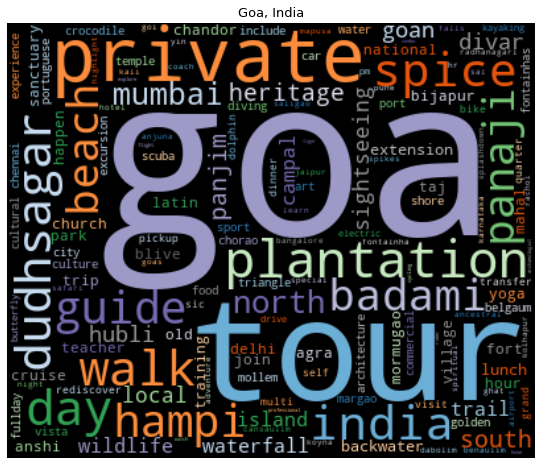

...

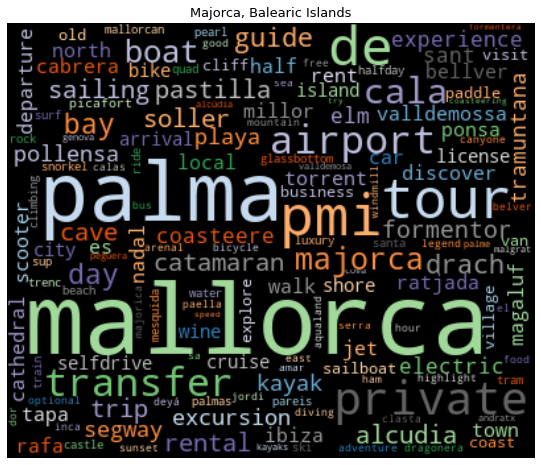

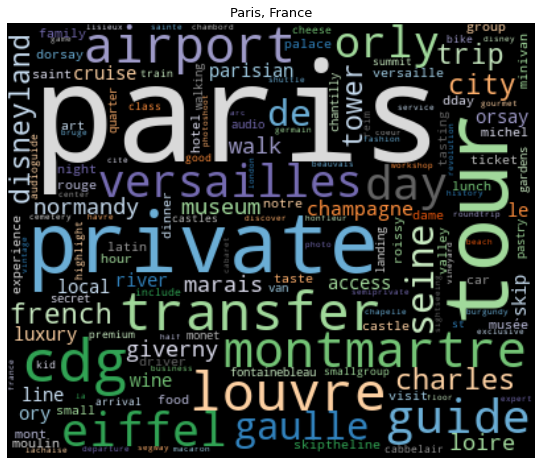

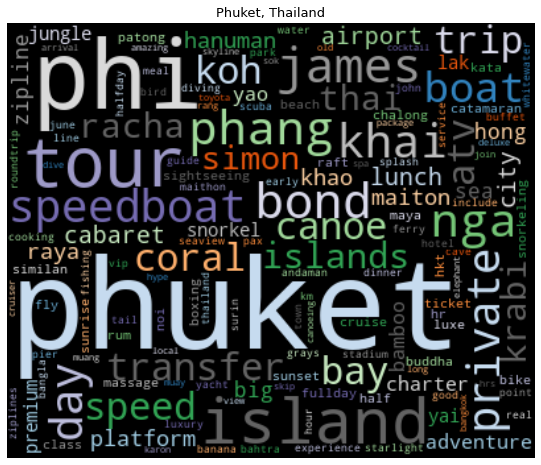

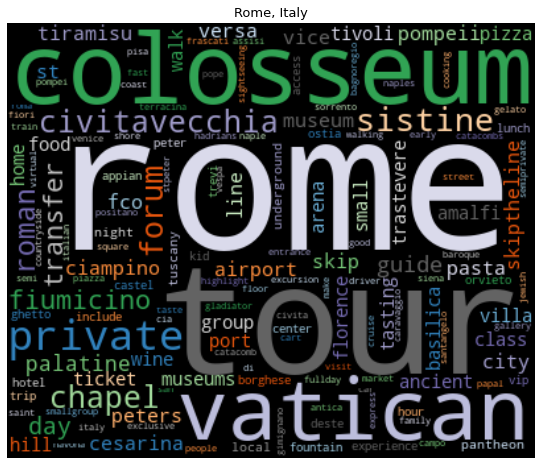

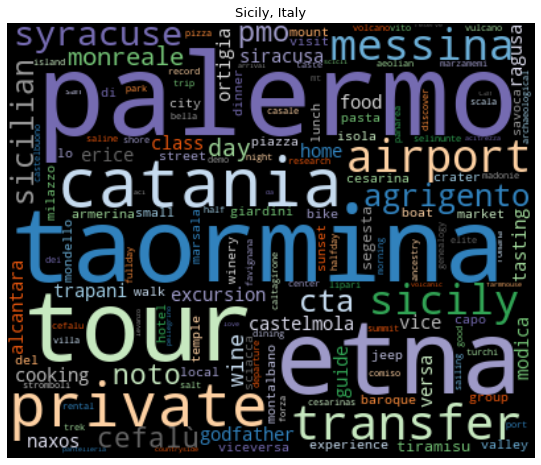

In [180]:
# Transposing document term matrix
df_dtm2 = df_dtm2.transpose()

# Plotting word cloud for each city
for index, city in enumerate(df_dtm2.columns):
    generate_wordcloud(df_dtm2[city].sort_values(ascending=False), city)

**In contrast, there is not as much overlap with these words as in the count vectorization because tf-idf vectorization is finding more words that are unique to the cities. This tells us that tf-idf vectorization is probably a better vectorization technique to use while modeling in order to best predict the cities.**

### Try working with bi-grams

In [222]:
cv2 = CountVectorizer(analyzer='word', stop_words=stopwords_list, ngram_range=(2,2))
data3 = cv2.fit_transform(df_grouped['cleaned'])
df_dtm3 = pd.DataFrame(data3.toarray(), columns=cv2.get_feature_names())
df_dtm3.index = df_grouped.index
df_dtm3

,aal deep,abandon ghost,abandon hotel,abandon village,abant yedigoller,abba sup,abbate arrival,abbey avebury,abbey banquet,abbey buckingham,...,روما إلى,فورميا العكس,كاستيلوا العكس,مدينة بوجيوا,مدينة تشيتا,مدينة روما,مدينة فورميا,من مدينة,ميرتيتوا العكس,نقل خصوصي
City,,,,,,,,,,,,,,,,,,,,,
"Bali, Indonesia",0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Barcelona, Spain",1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Crete, Greece",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Dubai, United Arab Emirates",0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Goa, India",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Istanbul, Turkey",0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"London, United Kingdom",0,0,0,0,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
"Majorca, Balearic Islands",0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Paris, France",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [223]:
# Save the bi-gram document term matrix for later use
df_dtm3.to_csv('/Users/tiaplagata/Documents/Flatiron/capstone-project/Data/bigram_dtm')

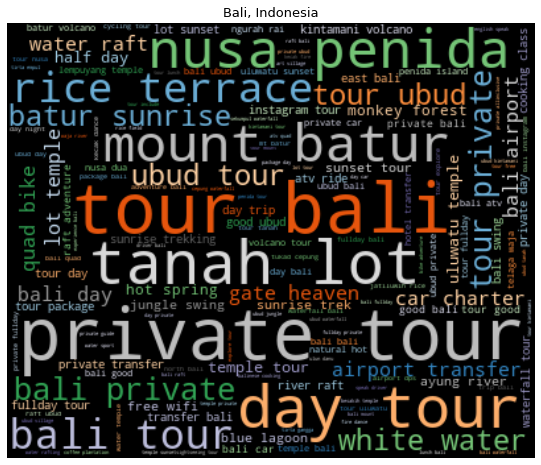

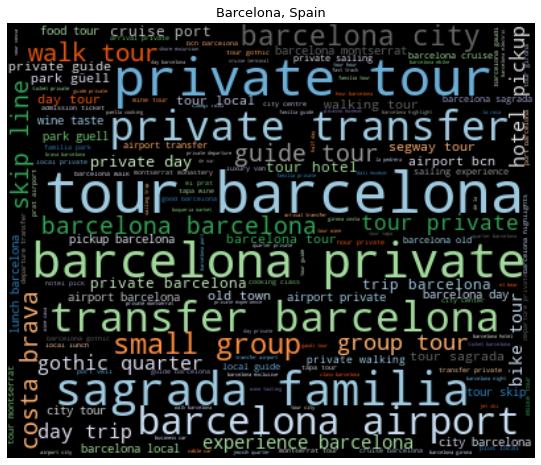

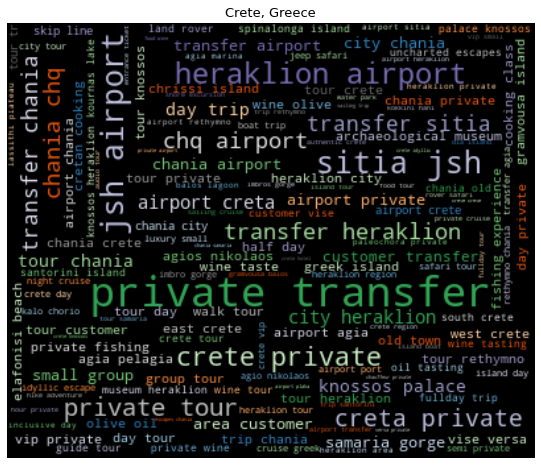

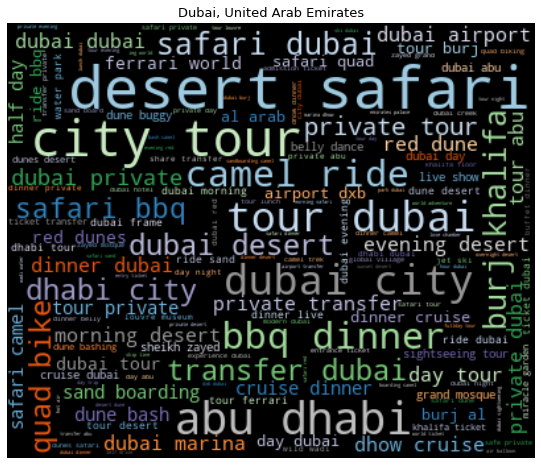

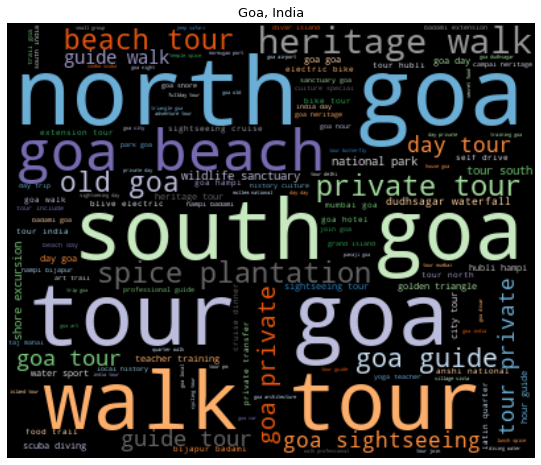

...

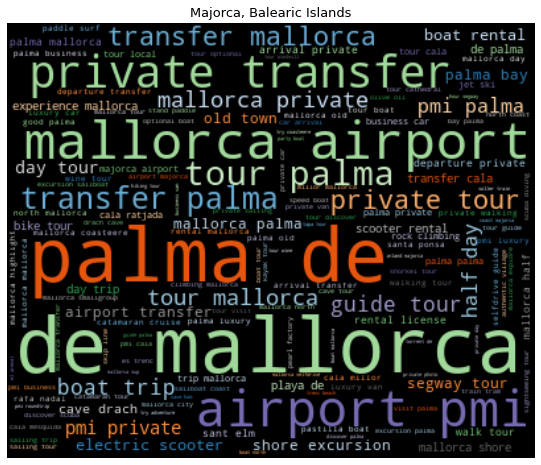

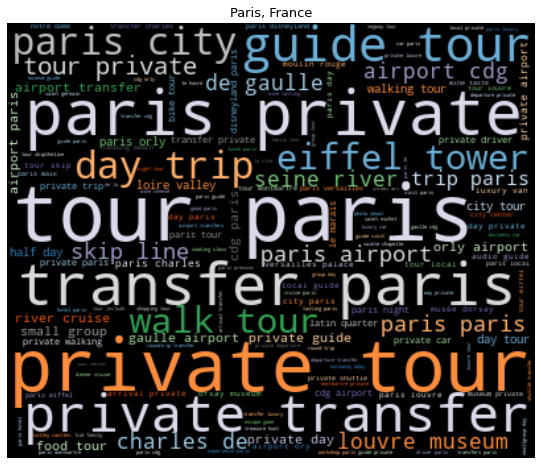

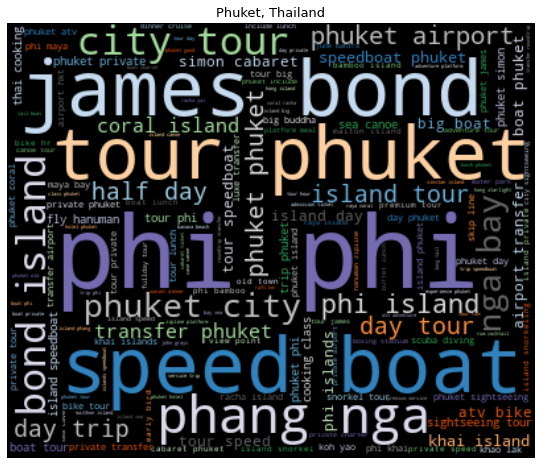

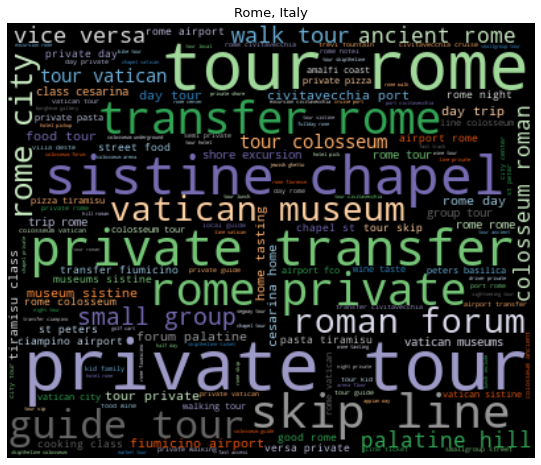

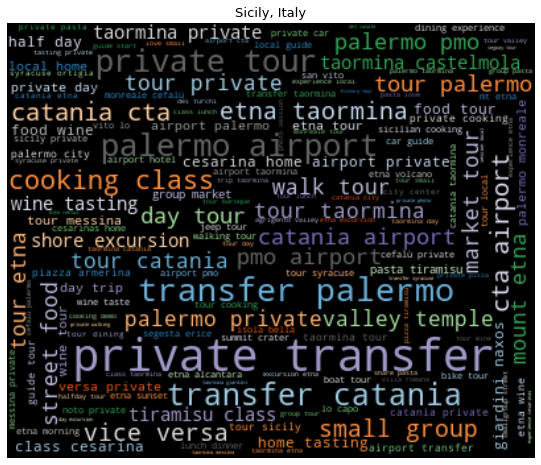

In [224]:
# Transposing document term matrix
df_dtm3 = df_dtm3.transpose()

# Plotting word cloud for each city
for index, city in enumerate(df_dtm3.columns):
    generate_wordcloud(df_dtm3[city].sort_values(ascending=False), city)

**The bi-grams were able to pick out important terms, such as 'windsor castle' for London, and 'cooking class' for Sicily. However, words like 'tour' are creating some noise in most of these cities.**